# Network science
## Taller de Data Science

### Instituto Data Science, Universidad del Desarrollo

* Prof. Diego Caro (dcaro en el dominio udd.cl).
* Prof. Eduardo Graells-Garrido (egraells en el dominio udd.cl).

https://twitter.com/diegocaro
https://twitter.com/carnby

https://github.com/diegocaro/tallerds

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt #para configurar graficos
import seaborn as sns #modulo para visualizaciones

sns.set(context='poster', style='white',palette='plasma',font_scale=1.0) #
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# Motivación

* ¿Qué podemos entender del mundo como una red?
  * Descubrir como interactúan sus partes.
  * Comprender que tan resistente es una red.
  * Compronder el flujo de información.

* Caso de estudio: Mark Lombardi dibujó entre los 80s y 90s los fraudes políticos y financieros
    * Información fue extraída a mano desde periódicos.
    * "...el trabajo (de Lombardi) fue revelador, no por las conecciones financieras y políticas, ... si no por la forma elegante de presentar información que antes estaba dispersa y como le dió sentido a las cosas..." Micheal Kimmelman*.
    

![newspapers](images/lombardi-cover.jpg)

![newspapers](images/newspapers.jpg)


* http://www.nytimes.com/2003/11/14/arts/art-review-webs-connecting-the-power-brokers-the-money-and-ultimately-the-world.html?mcubz=1

# Blogs sobre política

![politicalblogs](images/political_blogs.png)

Lada A. Adamic and Natalie Glance. 2005. The political blogosphere and the 2004 U.S. election: divided they blog. In Proceedings of the 3rd international workshop on Link discovery (LinkKDD '05). ACM, New York, NY, USA, 36-43. DOI=http://dx.doi.org/10.1145/1134271.1134277 

# Red social

* Egonetwork: la red social compuesta por mis amigos y las relaciones entre ellos.
* Color representa comunidades.

![facebook](images/facebook.png)

* Extraído desde slides curso Social Network Analyisis de la Dra. Lada Adamic. http://www.ladamic.com/

# Facebook 

* Stanley Milgram diseñó un experimento para calcular el grado de separación entre dos personas desconocidas.

![smallworld](images/smallworldexample.gif)


* En 2016, Facebook calculó que el grado de separación promedio es 3.57

![smallworld](images/facebooksixdegrees.png)


* Travers, Jeffrey, and Stanley Milgram. “An Experimental Study of the Small World Problem.” Sociometry, vol. 32, no. 4, 1969, pp. 425–443. JSTOR, JSTOR, www.jstor.org/stable/2786545.
* https://research.fb.com/three-and-a-half-degrees-of-separation/


# Flujo de información en una Organización

* Directores de una compañía desean saber por qué la información que le llega a sus asociados (empleados) no tiene relación con las intenciones de la dirección.

![maven1](images/maven1.png)
![maven2](images/maven2.png)



* Con una encuesta la compañía descubrió personas influyentes que difunden información (hubs).

![maven3](images/maven3.png)

* Ninguno de los directores es un hub, tampoco los managers top... los hubs son empleados de higiene y seguridad que visitan cada sede de la empresa y hablan con los empleados!


![maven4](images/maven4.png)

* Es más, la mayoría de los empleados está a más de 2 links de los hubs.

![maven5](images/maven5.png)

* Pregunta: ¿Qué deberían hacer los directores para mejorar la comunicación?






* Barabási, Albert-László. Network Science. Disponible en http://www.networksciencebook.com/

# Red de ingredientes

![ingredients](images/ingredients.png)

* Chun-Yuen Teng, Yu-Ru Lin, and Lada A. Adamic. 2012. Recipe recommendation using ingredient networks. In Proceedings of the 4th Annual ACM Web Science Conference (WebSci '12). ACM, New York, NY, USA, 298-307. DOI=http://dx.doi.org/10.1145/2380718.2380757 
* Extraído desde slides curso Social Network Analyisis de la Dra. Lada Adamic. http://www.ladamic.com/

# ¿Qué es una red?

* Una red es un conjunto de vértices conectados por aristas.
* Red = Grafo (Network = Graph)

| Puntos        | Lineas           |   |
| ------------- |:-------------:| -----:|
| vértices      | aristas, arcos | Matemática / Computer Science |
| nodos      | links/enlaces | Computer Science |
| actores    | relación | Ciencias Sociales


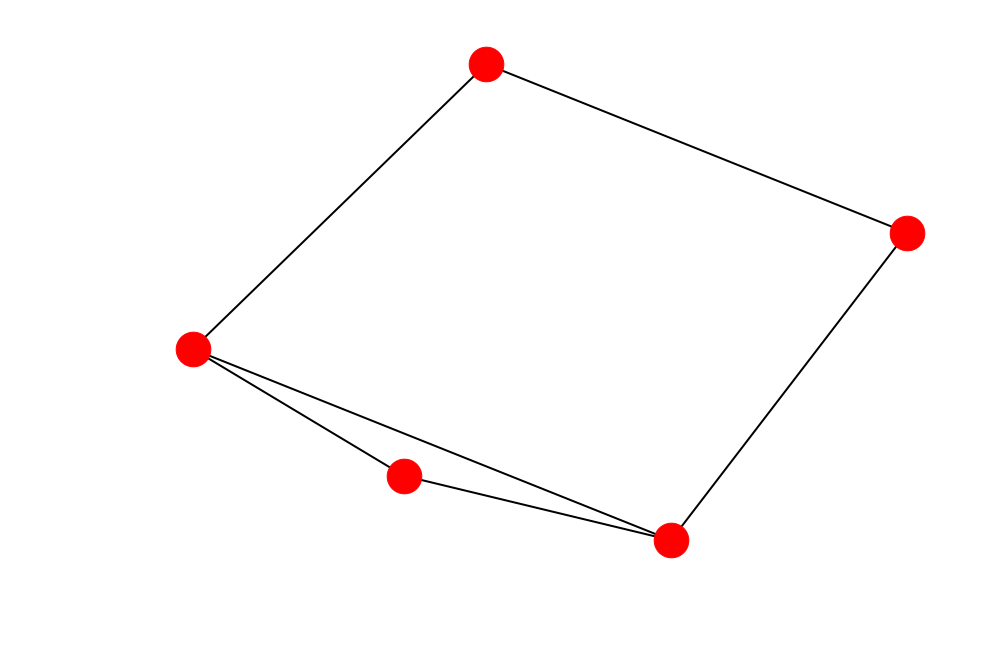

In [4]:
import networkx as nx
G = nx.Graph()
G.add_nodes_from([1,2,3,4,5])
G.add_edges_from([(1,2), (1,5), (2,3), (3,5), (4,5), (4,1)])

nx.draw(G)

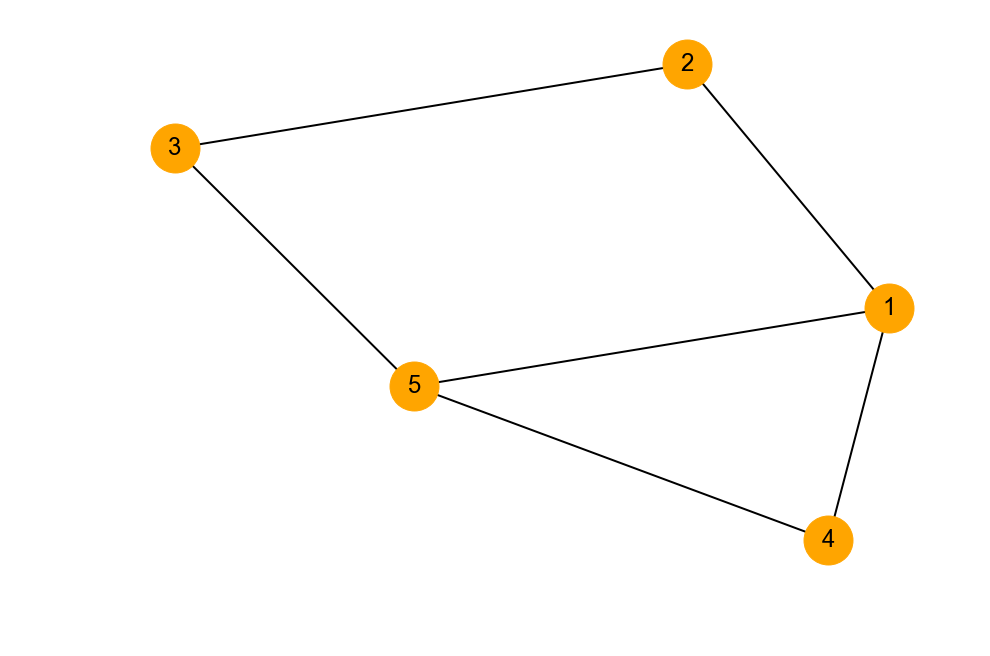

In [5]:
options = {'font_color': 'black', 'node_color':'orange', 'node_size':600, 'with_labels':True}
nx.draw(G, **options)

In [6]:
try:
    import pygraphviz
    from networkx.drawing.nx_agraph import graphviz_layout
    layout = graphviz_layout
except ImportError:
    print("PyGraphviz and pydot not found;\n"
          "drawing with spring layout;\n"
          "will be slow.")
    layout = nx.spring_layout

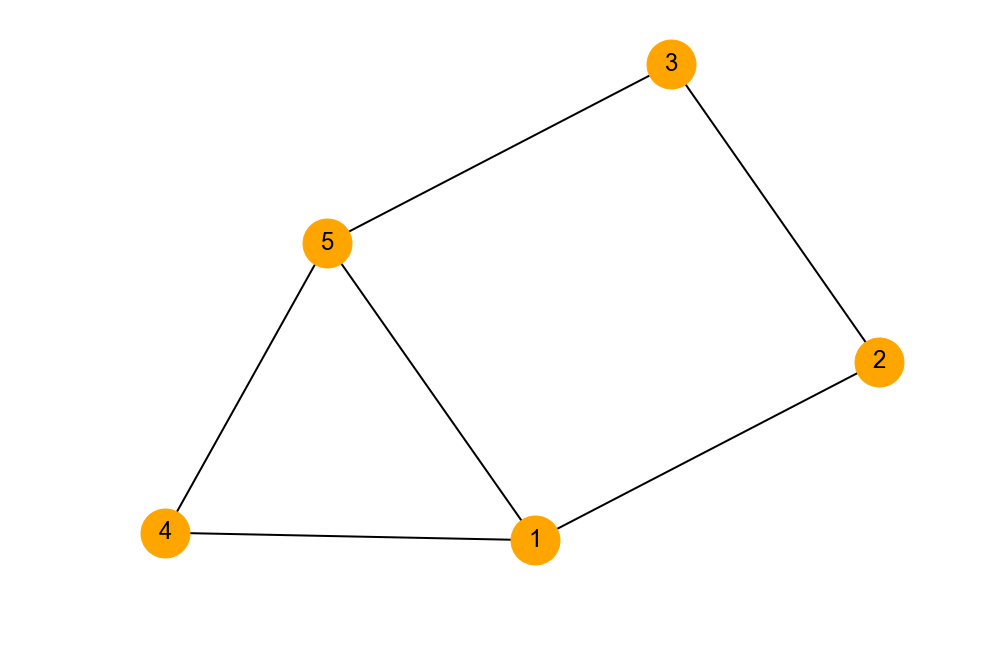

In [7]:
options = {'font_color': 'black', 'node_color':'orange', 'node_size':600, 'with_labels':True}

pos = layout(G)
nx.draw(G, pos, **options)

Ojo: Dos grafos son equivalentes, aunque se dibujen de distinta forma.

![equalnetwork](images/equalnetwork.png)

* Extraído de libro Algorithms (Sedgewick y Wayne). http://algs4.cs.princeton.edu/home/

# Aristas

* Tipos de aristas
    * **Dirigida**: A -> B 
        * A le gusta B, A es hijo de B, 
    * **No dirigida**: A <-> B ó A - B
        * A y B se gustan mutuamente, A y B son hermanos, co-autores

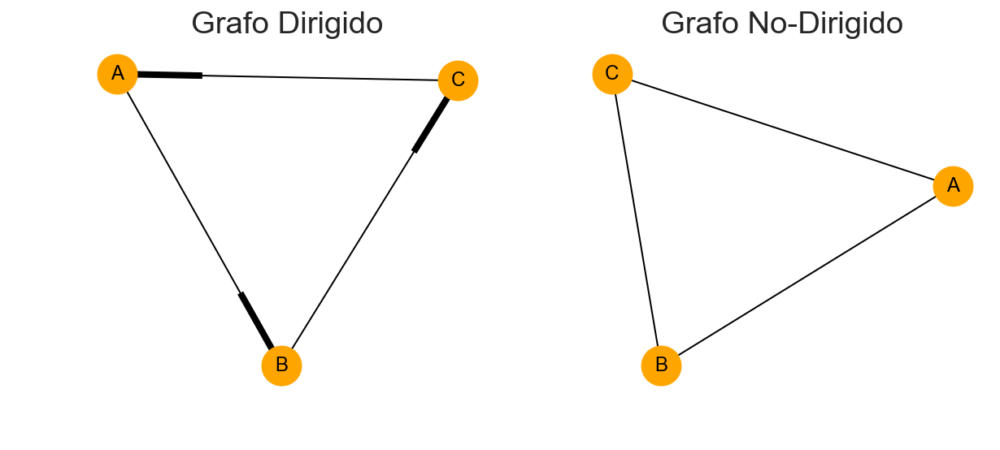

In [8]:
diG = nx.DiGraph()
diG.add_nodes_from(['A','B','C'])
diG.add_edges_from([('A','B'), ('B','C'), ('C','A')])

G = nx.Graph()
G.add_nodes_from(['A','B','C'])
G.add_edges_from([('A','B'), ('B','C'), ('C','A')])

plt.figure(figsize=(10,4))

plt.subplot(121)
plt.title('Grafo Dirigido')
nx.draw(diG, **options)

plt.subplot(122)
plt.title('Grafo No-Dirigido')
nx.draw(G, **options)

# Atributos en aristas

Ejemplos:
* Peso/weight: que tan frecuente es la comunicación, distancia entre dos ciudades
* Ranking: mejor amigo, segundo mejor amigo, tercer mejor amigo, etc...
* Tipo: amigo, colaborador, familiar


# Red dirigida

* Red con la preferencia de mesa para la cena de un internado.
![directednetwork](images/directednetwork.png)

* J.L. Moreno, The Sociometry Reader. Glencoe (Ill.), The Free Press, 1960, p. 35.
* Extraído desde slides curso Social Network Analyisis de la Dra. Lada Adamic. http://www.ladamic.com/

# Pesos negativos y positivos

* Red de confianza/desconfianza entre usuarios.
* Pregunta de investición: 
    * ¿Cómo un usuario propaga su negatividad en la red? 
    * ¿Es cierto que el enemigo de mi enemigo es mi amigo?

![epinions](images/epinions.png)

* Extraído desde slides curso Social Network Analyisis de la Dra. Lada Adamic. http://www.ladamic.com/

# Vertices

* ¿Cuál vértice tiene más conexiones?

In [9]:
Gba = nx.generators.barabasi_albert_graph(100, 3)
pos = nx.spring_layout(Gba)
node_size = [s * 10 for v,s in nx.degree(Gba)]

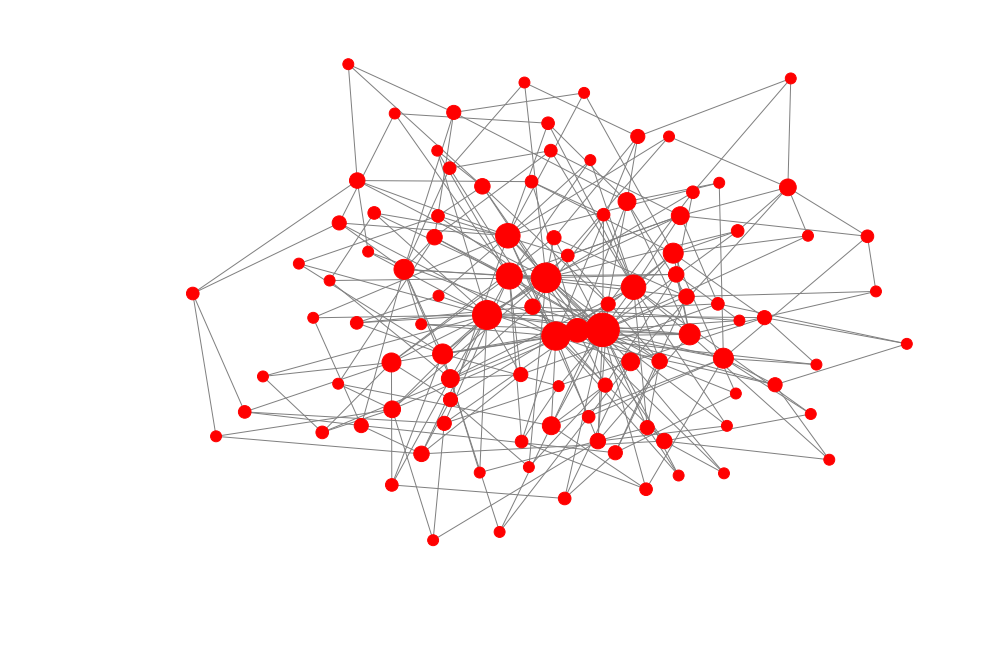

In [10]:
nx.draw(Gba, pos, node_size=node_size, edge_color='gray', width=0.5)

* **Grafos dirigidos**:
    * in-degree: número de aristas dirigidas que inciden en un vértice
    * out-degree: número de aristas dirigidas que se originan en un vértice
    * degree: número de aristas que inciden en un vértice
* **Grafos no-dirigidos**:
    * degree: número de aristas que inciden en un vértice

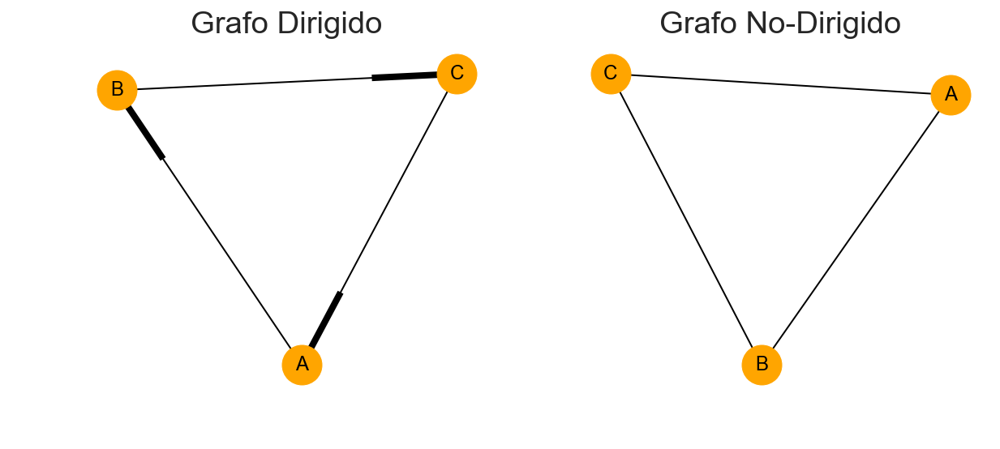

In [11]:
diG = nx.DiGraph()
diG.add_nodes_from(['A','B','C'])
diG.add_edges_from([('A','B'), ('B','C'), ('C','A')])

G = nx.Graph()
G.add_nodes_from(['A','B','C'])
G.add_edges_from([('A','B'), ('B','C'), ('C','A')])

plt.figure(figsize=(10,4))

plt.subplot(121)
plt.title('Grafo Dirigido')
nx.draw(diG, **options)

plt.subplot(122)
plt.title('Grafo No-Dirigido')
nx.draw(G, **options)

In [12]:
diG.in_degree('A'), diG.out_degree('A'), diG.degree('A'), 

(1, 1, 2)

In [13]:
G.degree('A')

2

In [14]:
options

{'font_color': 'black',
 'node_color': 'orange',
 'node_size': 600,
 'with_labels': True}

# Métricas de redes

* Secuencia de grados: lista ordenada del in-out degree de cada vértice

In [15]:
diG = nx.DiGraph()
diG.add_nodes_from(['B','C','D','A','E','F','H','G'])
diG.add_edges_from([('E','B'), ('F','H'), ('G','H'), ('H','G'),('B','D'), ('B','C'), ('C','B'), ('C','D'),('D','E'), ('E','A'), ])
pos = layout(diG)

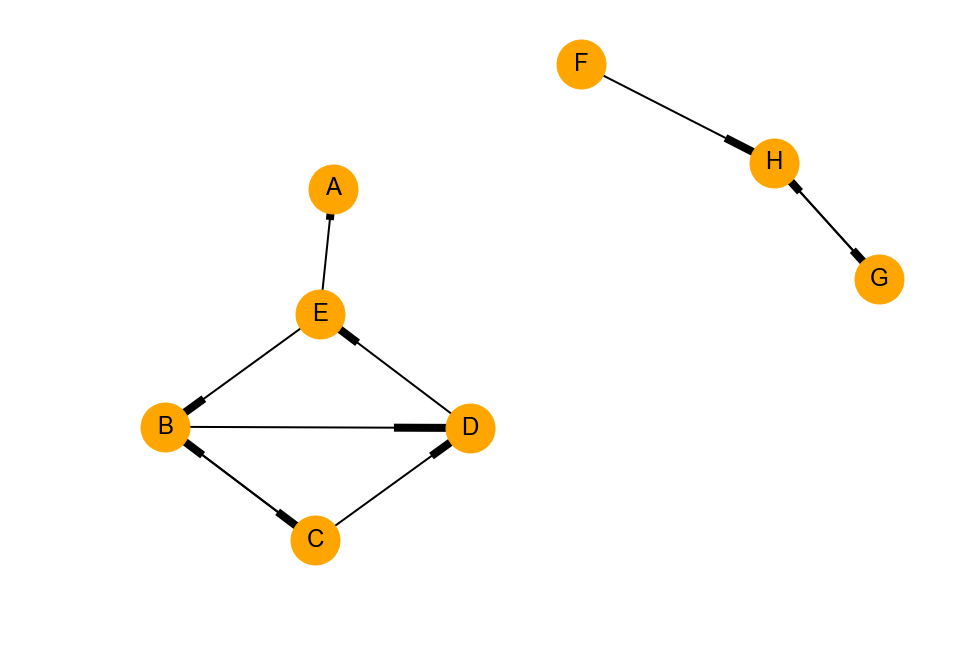

In [16]:
nx.draw(diG, pos, **options,)

In [17]:
# secuencia in-degree
print(list(diG.in_degree()))

[('B', 2), ('C', 1), ('D', 2), ('A', 1), ('E', 1), ('F', 0), ('H', 2), ('G', 1)]


In [18]:
# secuencia out-degree
print(list(diG.out_degree()))

[('B', 2), ('C', 2), ('D', 1), ('A', 0), ('E', 2), ('F', 1), ('H', 1), ('G', 1)]


In [19]:
# secuencia degree
print(list(diG.degree()))

[('B', 4), ('C', 3), ('D', 3), ('A', 1), ('E', 3), ('F', 1), ('H', 3), ('G', 2)]


In [20]:
df = pd.DataFrame(list(diG.in_degree()), columns=['vertex','indegree'])
df.head()

,vertex,indegree
0,B,2
1,C,1
2,D,2
3,A,1
4,E,1


Text(0,0.5,'Frecuencia')

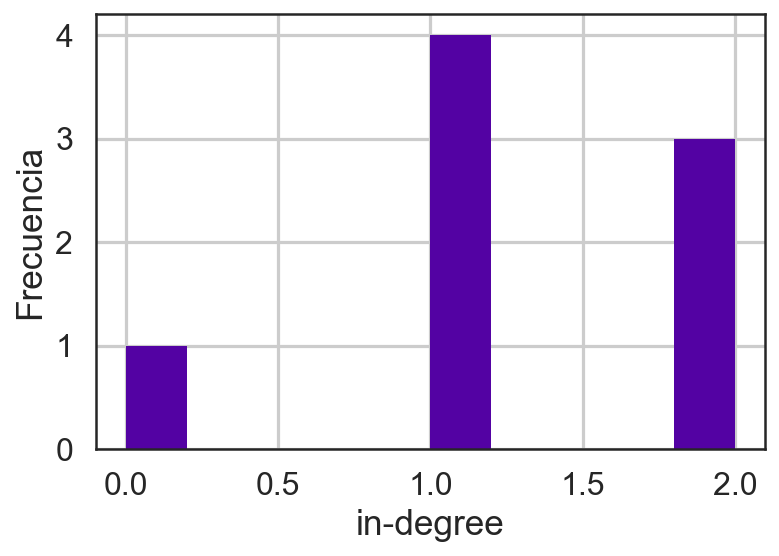

In [21]:
df.indegree.hist();
plt.xlabel('in-degree')
plt.ylabel('Frecuencia')

# ¿Está todo conectado?

![connected component](images/cc.png)

# Componentes conexos

<img src="images/scc.png" style="float:right; width: 30%" />

### Componentes fuertemente conexos
* Subgrafo donde cada vértice puede ser alcanzado desde cualquier otro vértice **siguiendo la dirección** de las aristas.
* Aka: SCC, strongly connected components
* Ejemplo:
  1. B, C, D, E
  2. A
  3. G, H
  4. F


<div style="clear:right;" />

<img src="images/wcc.png" style="float:right; width: 30%" />
### Componentes debilmente conexos

* Subgrafo donde cada vértice puede ser alcanzado desde cualquier otro vértice, **sin importar la dirección** de las aristas.
* Aka: WCC, weakly connected componentes
* Ejemplo:
  1. A, B, C, D, E
  2. G, H, F


* En grafos dirigidos solo se habla de componentes conexos.

<img src="images/giantcc.png" style="float:right; width: 50%" />

### Giant Component


* Si el componente conexo más grande sobrepasa una fracción de la red, se le denomina **Giant component**.



# Ejemplo

* Red corresponde a la preferencia de personas en la mesa de la cena.
    * Cada mujer escoge dos personas con las que prefiere sentarse.
    * Grafo dirigido.

Preguntas:
* ¿Quién es la persona más popular?

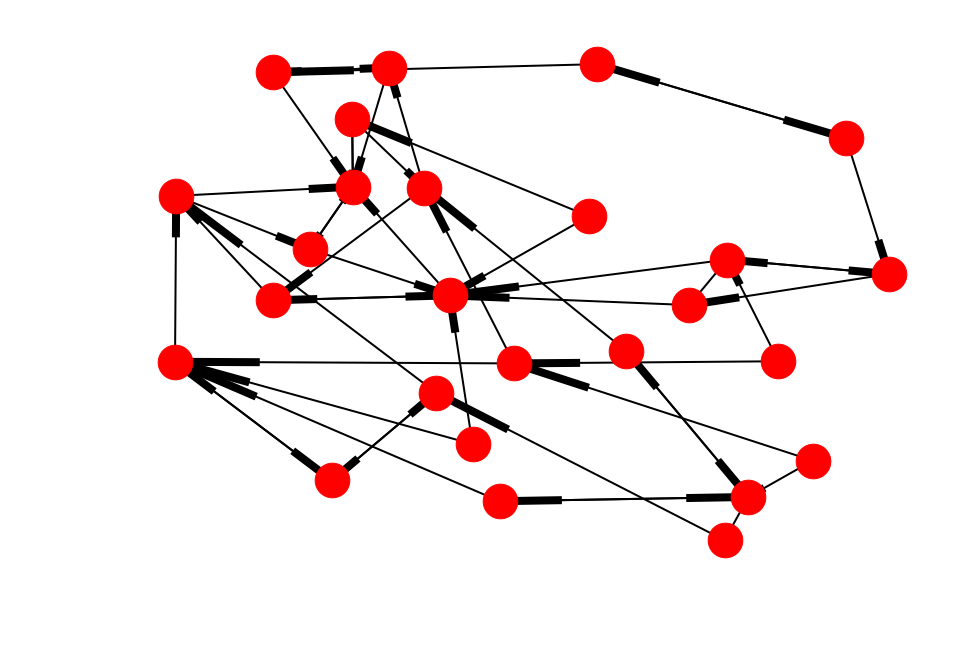

In [31]:
dining = nx.readwrite.graphml.read_graphml('dining.graphml')
nx.draw(dining)

Mmmm... la visualización no nos dice mucho. Nos falta agregar el nombre de cada persona en los vértices.
En este caso, el nombre está codificado como una propiedad de los nodos:

In [32]:
dining.nodes.data('label')

NodeDataView({'1': 'Ada', '2': 'Cora', '3': 'Louise', '4': 'Jean', '5': 'Helen', '6': 'Martha', '7': 'Alice', '8': 'Robin', '9': 'Marion', '10': 'Maxine', '11': 'Lena', '12': 'Hazel', '13': 'Hilda', '14': 'Frances', '15': 'Eva', '16': 'Ruth', '17': 'Edna', '18': 'Adele', '19': 'Jane', '20': 'Anna', '21': 'Mary', '22': 'Betty', '23': 'Ella', '24': 'Ellen', '25': 'Laura', '26': 'Irene'}, data='label')

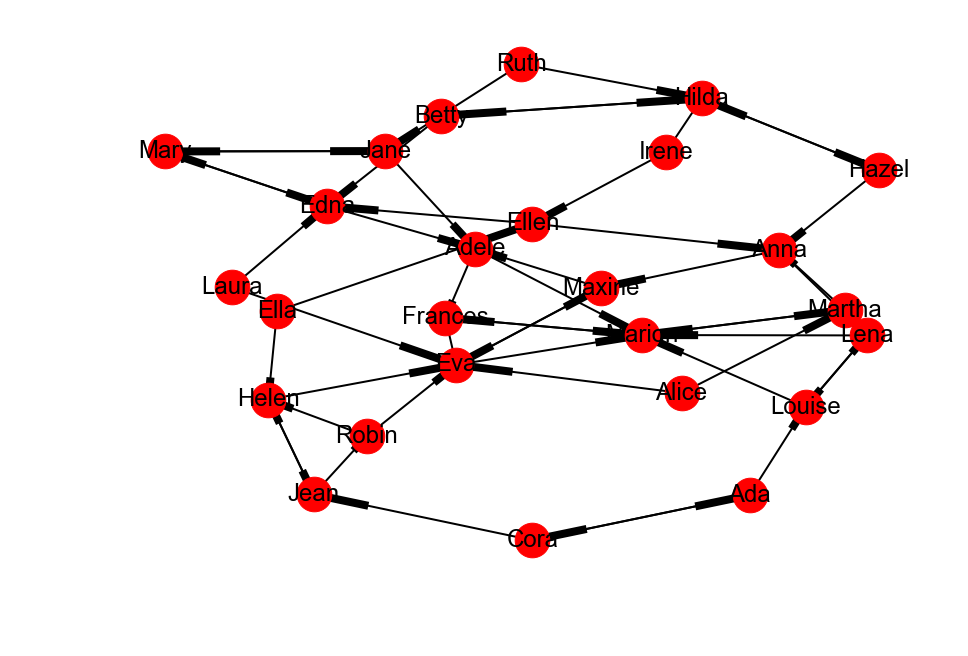

In [33]:
pos = layout(dining) # mejora visualización
nx.draw(dining, pos, labels=dict(dining.nodes.data('label')))

Ahora nos falta una métrica para reflejar la popularidad. Podríamos usar el out-degree, per como todos escogen a dos personas, el out-degree es el mismo para cada vértice.
En cambio, el in-degree indica cuantas personas escogieron a otra!

Cambiaremos el tamaño de los vértices para reflejar el in-degree:


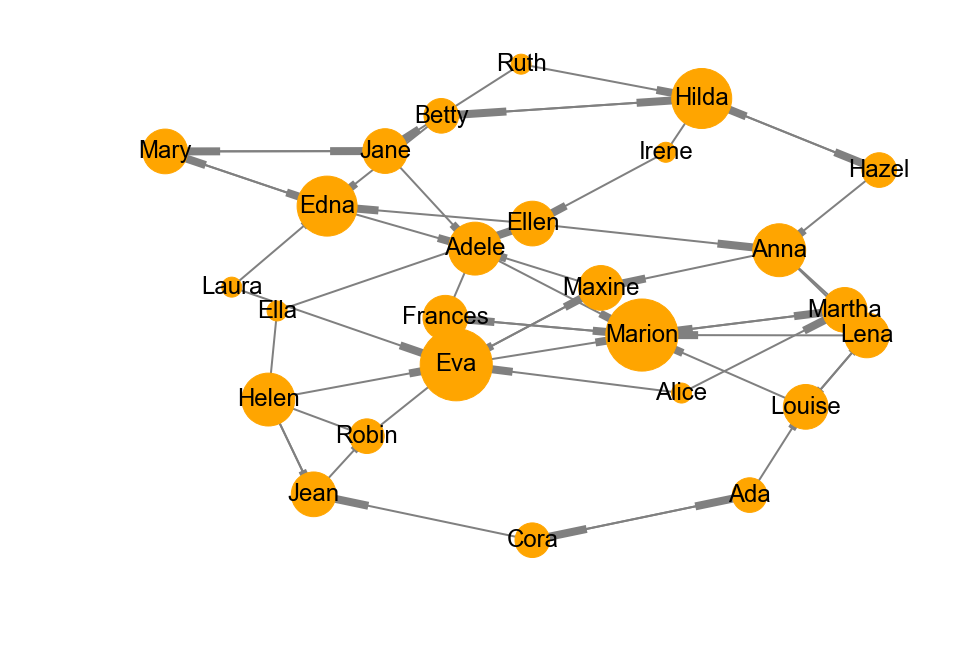

In [34]:
pos = layout(dining) #mejora visualización
node_size = [100 + s*200 for v,s in dining.in_degree()]
options = {'node_color':'orange', 'node_size':node_size, 
           'edge_color':'gray', 'labels':dict(dining.nodes.data('label'))}

nx.draw(dining, pos, **options )

* ¿Cuál es la distribución de in-degree?

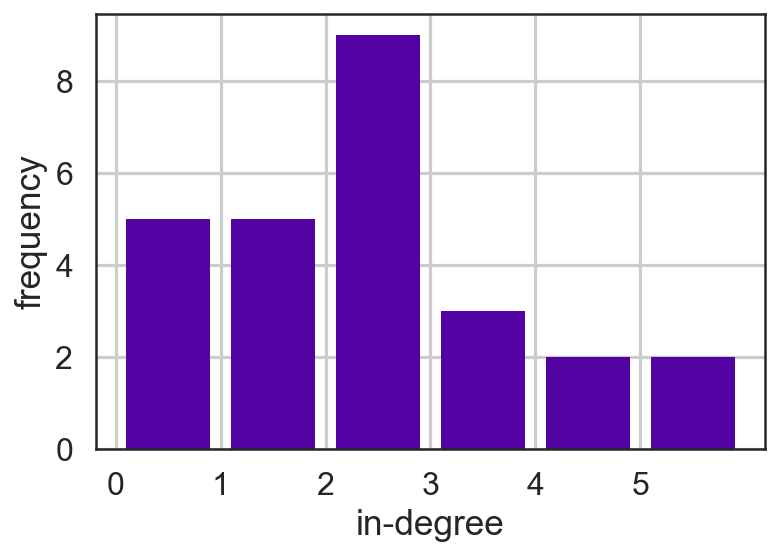

In [35]:
df = pd.DataFrame(list(dining.in_degree()), columns=['vertex','indegree'])
df.indegree.hist(bins=df.indegree.max(), rwidth=0.8)
plt.xlabel('in-degree')
plt.ylabel('frequency')
plt.xticks(range(df.indegree.max()),);

* Si quisiera correr un rumor a la mayor parte de la red, ¿con quién me debería sentar?

Para esta pregunta podríamos calcular los componentes conexos. Veamos cuantos hay.

In [36]:
# Vértices de los componentes debilmente conexos
print(list(nx.weakly_connected_components(dining)))

[{'13', '18', '6', '20', '8', '1', '14', '5', '16', '9', '12', '21', '10', '19', '23', '11', '25', '3', '2', '26', '24', '15', '7', '22', '4', '17'}]


Como hay un solo componente débilmente conexo, podría hablar con cualquier persona... pero sabemos que solo algunas prefieren hablar entre sí, y quizás el mensaje no llega a la mayor parte de la red.

Ahora veamos que sucede con los componentes fuertemente conexos:

In [37]:
# Vértices de los componentes fuertemente conexos
list(nx.strongly_connected_components(dining))

[{'10', '11', '14', '15', '18', '20', '3', '6', '9'},
 {'4', '5', '8'},
 {'1', '2'},
 {'7'},
 {'17', '19', '21'},
 {'12', '13', '22'},
 {'16'},
 {'24'},
 {'23'},
 {'25'},
 {'26'}]

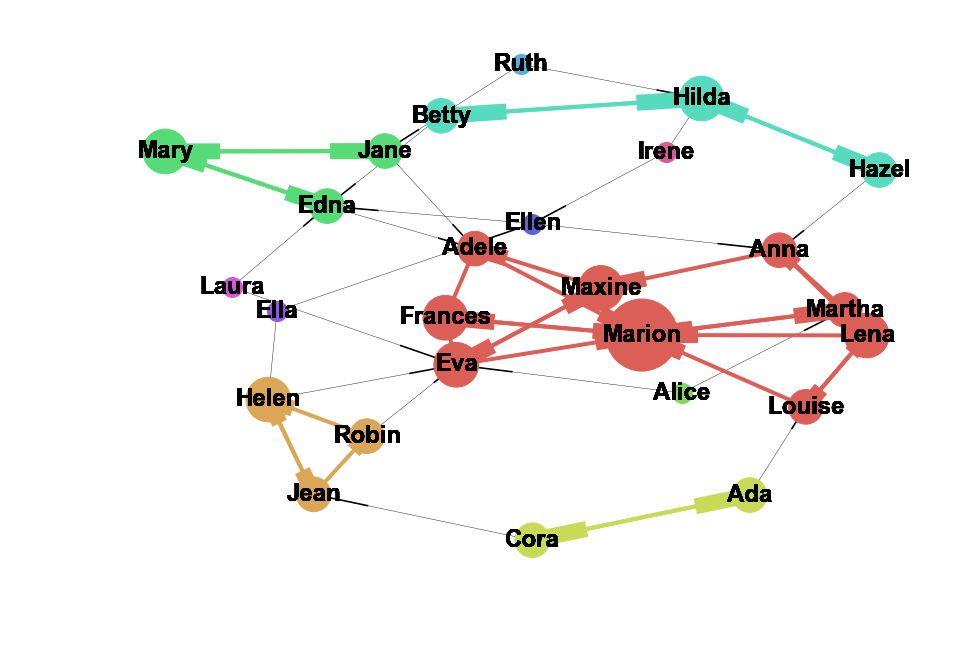

In [38]:
pos = layout(dining) #mejora visualización
node_size = [100 + s*200 for v,s in dining.in_degree()]

#calcula los componentes fuertemente conexos
scc = list(nx.strongly_connected_component_subgraphs(dining))

#asigna un color a cada componente
colors = sns.color_palette("hls", len(scc)).as_hex()

#opciones para dibujar el grafo y los componentes
cc_options = {'labels':dict(dining.nodes.data('label')), 'font_weight':'bold'}

nx.draw(dining, pos, node_size=0, width=0.2, **cc_options)
for sg, color in zip(scc, colors):
    sg_size = [100 + s*200 for v,s in sg.in_degree()]
    nx.draw(sg, pos, edge_color=color, node_color=color, node_size=sg_size, width=2, **cc_options)

# Métricas de centralidad

* ¿Cuán es importante es un vértice en la red (más allá de la popularidad)?
* Ejemplo: 
    * ¿Cuáles son los vértices necesarios para mantener la infraestructura (eléctrica, sanitaria, logística)?
    * ¿Actores más relevantes en la historia de una película?


![centralitytypes](images/centralitytypes.png)

* www.moviegalaxies.com: red de personajes en películas
![pulpfictiona](images/pulpfiction.png)
![forrestgam](images/forrest.png)

# In/Out degree centrality

* In/Out Degree Centrality: que tan importante es un vértice en relación a sus vecinos directos.
* In-Degree Centrality: fracción de los vértices que inciden en un vértice.

![indegree](images/indegree-centrality.png)


## In-degree Centrality
* Red compuesta por países. Las aristas van desde el exportador al importador.
* Tamaño del arista es cuanto petroleo y productos importan.
* Pregunta: ¿Cuál es el país con más in-degree? ¿Qué significa?

![indegree](images/indegree-import.png)

* Imagen por Dra. Lada Adamic.

## Out-degree Centrality

* Out-Degree centrality: fracción de vértices que son adyacentes al vértice.

* Tamaño y color de los vértices es el ratio entre exportaciones e importaciones:
    * Más grande (y azul), más exporta.
    * Más pequeño (y rojo), menos exporta. 

* Pregunta: ¿Qué país tiene un bajo out-degree pero exporta una gran cantidad (tamaño de aristas indica $) de derivados del petróleo? ¿Es eso posible?

![indegree](images/outdegree-import.png)

* Imagen por Dra. Lada Adamic.

* Entrega poca información sobre que tan importante es un vértice para toda la red.
* Ejemplo, no permite cuantificar que tan importante es el país que más importa petróleo.









## Ejemplos Degree centrality

In [39]:
g1 = nx.Graph()
g1.add_edges_from([(1,0), (1,2),(1,3),(1,4),(1,5)])
pos1 = layout(g1)

g2 = nx.Graph()
g2.add_edges_from([(0,1), (1,2),(2,0),(2,3), (3,4),(4,5),(5,6),(6,4) ])
pos2 = layout(g2)

options = {'node_color':'orange', 'node_size':node_size, 
           'edge_color':'gray', 'labels':dict(dining.nodes.data('label'))}

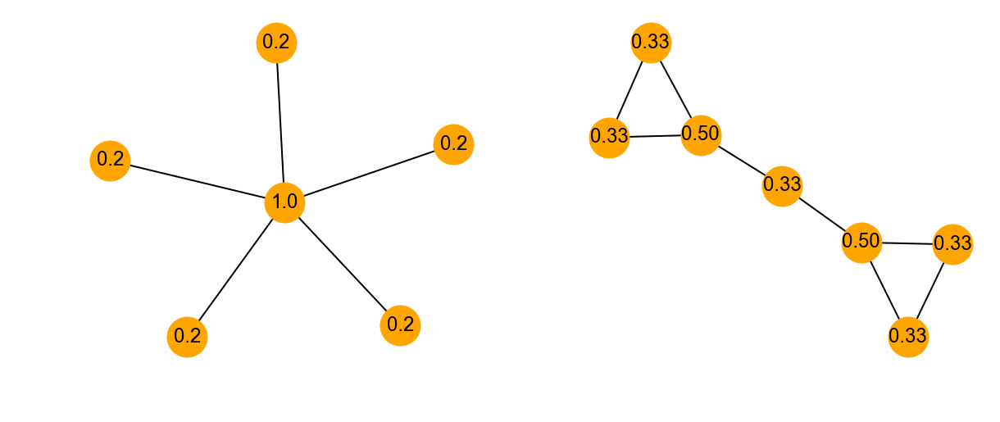

In [40]:
plt.figure(figsize=(10,4))
plt.subplot('121')
d1 = nx.degree_centrality(g1)
nx.draw(g1, pos1, labels=d1, node_color='orange', node_size=600)

plt.subplot('122')
d2 = nx.degree_centrality(g2)
nx.draw(g2, pos2, labels=dict([(u, '{:.2f}'.format(d)) for u,d in d2.items()]), node_color='orange', node_size=600)

Pregunta:
* ¿Qué propiedades no captura el degree centrality coef.?

# Betweeness centrality

* Intuición: Si todos los vértices quieren transmitir un mensaje al resto de la red, ¿cuántos mensajes deben pasar por mí si queremos que la transmisión requiera el menor número de intermediarios?

* Betweeness centrality: fracción de caminos más cortos que pasan a través de un vértice.


* Camino más corto: secuencia de vértices que conectan dos nodos de la red con el menor número de saltos:

In [41]:
karate = nx.karate_club_graph()
pos = layout(karate)

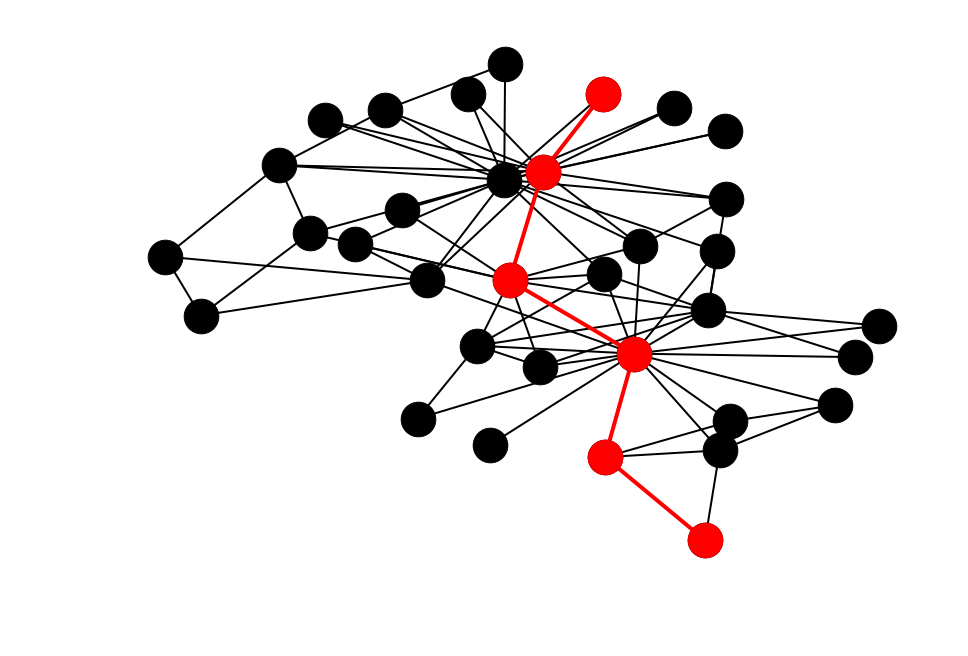

In [42]:
# draw path in red
path = nx.shortest_path(karate, source=14, target=16)
path_edges = list(zip(path, path[1:]))

nx.draw(karate,pos,node_color='k')
nx.draw_networkx_nodes(karate, pos, nodelist=path, node_color='r')
nx.draw_networkx_edges(karate, pos, edgelist=path_edges, edge_color='r', width=2)

* Interpretación:
    * Coeficientes cercanos a 1 indican que una gran fracción de caminos pasan por el nodo, y por lo tanto el nodo es importante.
    * Coeficientes cercanos a 0, no es necesario que el nodo exista para transmitir rápidamente un rumor.


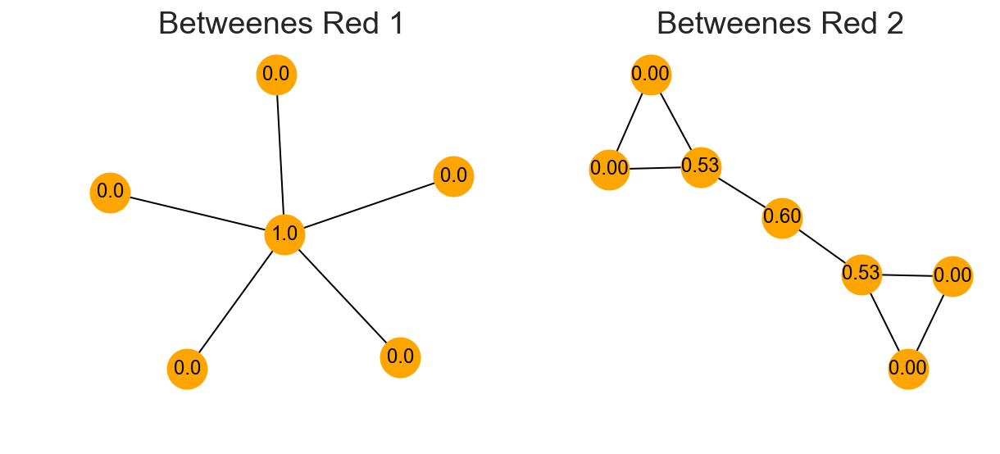

In [32]:
plt.figure(figsize=(10,4))
plt.subplot('121')
plt.title('Betweenes Red 1')
d1 = nx.betweenness_centrality(g1)
nx.draw(g1, pos1, labels=d1, node_color='orange', node_size=600)

plt.subplot('122')
plt.title('Betweenes Red 2')
d2 = nx.betweenness_centrality(g2)
nx.draw(g2, pos2, labels=dict([(u, '{:.2f}'.format(d)) for u,d in d2.items()]), node_color='orange', node_size=600)

Pregunta: 
* ¿Qué consecuencias tiene para una red si un vértice con un alto/bajo betweeness es removido de la red?

Aplicaciones:
* ¿Qué estaciones de metro son más propensas a causar una gran demora en el transporte público si dejan de funcionar?
* ¿Qué intersecciones podría intervenir para mejorar flujo de transporte público?


* Encuentra un vértice con un alto betweenness, pero con bajo degree.
* Encuentra un vértice con un alto betweenness, pero con alto degree.

![between](images/between-quiz.png)




# Closeness centrality

* Intuición: no quiero tener que enterarme de todo, pero si deseo enterarme quiero tener cerca a quién podría saber.
![closeness](images/closeness-example.png)
   

* Closeness centrality: recíproco de la distancia del camino más corto para conectar un vértice al resto de la red.
* Interpretación:
    * ¿Qué tan lejos estoy del resto de los vértices de la red?
    * Coeficientes cercanos a 1 indican que en promedio estás cerca de todos los vértices.
    * Coeficientes cercanos a 0 indican que estás lejos del resto de la red.

* Camino más corto: número de aristas que conectan dos vértices. Si el grafo tiene pesos en las aristas, el camino más corto se considera como el camino con menor peso.

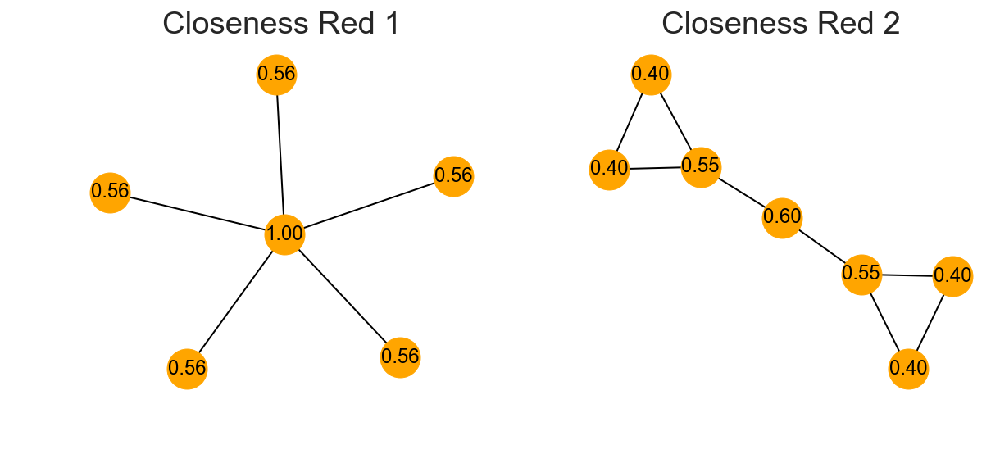

In [33]:
plt.figure(figsize=(10,4))
plt.subplot('121')
plt.title('Closeness Red 1')

d1 = nx.closeness_centrality(g1)
nx.draw(g1, pos1, labels=dict([(u, '{:.2f}'.format(d)) for u,d in d1.items()]), node_color='orange', node_size=600)


plt.subplot('122')
plt.title('Closeness Red 2')
d2 = nx.closeness_centrality(g2)
nx.draw(g2, pos2, labels=dict([(u, '{:.2f}'.format(d)) for u,d in d2.items()]), node_color='orange', node_size=600)

* Existe muchas otras medidas de centralidad!


# Recursos

* Albert-Lazlo Barabási. Network Science. Cambridge University Press, 2016. http://www.networksciencebook.com/
* Mark Newman. 2010. Networks: An Introduction. Oxford University Press, Inc., New York, NY, USA. 
* Easley David and Kleinberg Jon. 2010. Networks, Crowds, and Markets: Reasoning about a Highly Connected World. Cambridge University Press, New York, NY, USA. 

Python:
* NetworkX: usable, pero lento https://networkx.github.io/ 
* Graph Tool: dificil de instalar, pero rápida https://graph-tool.skewed.de/

# Caso de estudio: red de transporte

El grafo para este caso de estudio corresponde a la red de transporte de la comuna de Las Condes.
Los vértices representan esquinas, mientras que las aristas corresponden a las calles que conectan las esquinas.

La creación del grafo está descrita en el notebook [Red de Transporte](Tutorial 05 Red de transporte.ipynb).

In [34]:
G = nx.read_graphml('data/scl-lascondes-network.graphml')

In [69]:
from smopy import Map as SmopyMap
from shapely.geometry import Point
import geopandas as gpd

def plot_centrality(G, centrality):
    geometry = [Point(float(x),float(y)) for (_,x),(_,y) in zip(G.nodes.data('x'),G.nodes.data('y'))]
    geodf = gpd.GeoDataFrame(data = list(G.node), geometry=geometry)

    bounds = geodf.total_bounds
    bbox = (bounds[1], bounds[0], bounds[3], bounds[2])
    smopy_map = SmopyMap(bbox, z=12, margin=0)

    fig = plt.figure(figsize=(30, 30))
    plt.imshow(smopy_map.img, alpha=0.5)
    
    xx, yy = smopy_map.to_pixels(geodf.geometry.y, geodf.geometry.x)
    minx,maxx = min(xx), max(xx)
    miny,maxy = min(yy), max(yy)
    
    pos = dict([(v,(float(x),float(y))) for (v,x,y) in zip(G.nodes,xx,yy)])

    nx.draw(G, pos, edge_color='gray', alpha=0.9,
            node_color=[10+s*300 for v,s in centrality.items()], 
            node_size = [20+s*3000 for v,s in centrality.items()], 
            cmap=sns.light_palette("blue",as_cmap=True))
    plt.xlim(minx-10,maxx+10)
    plt.ylim(maxy+10,miny-10)

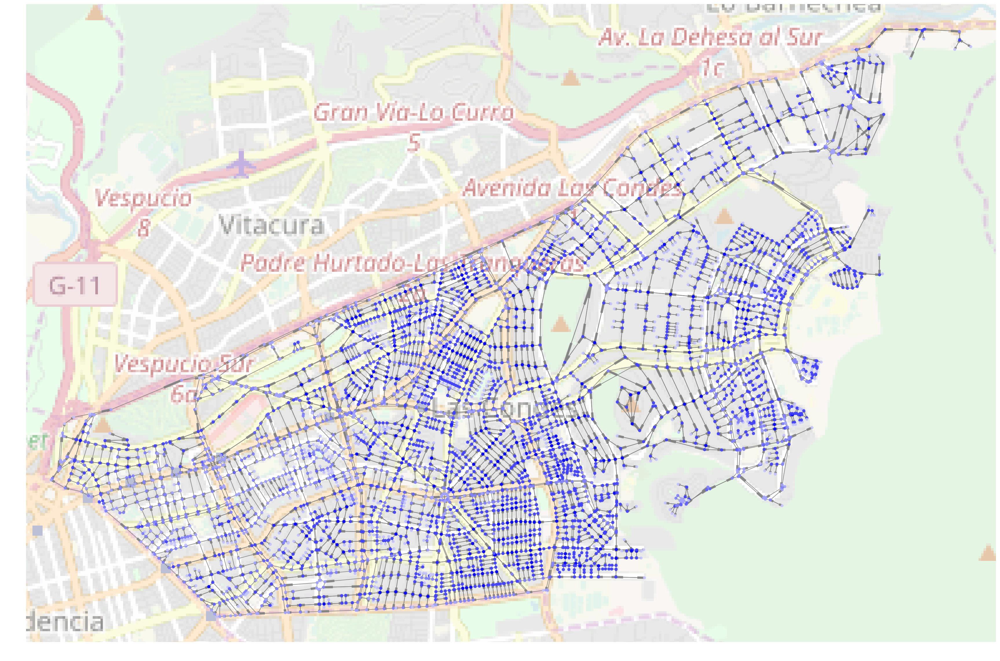

In [70]:
c = nx.degree_centrality(G)
plot_centrality(G, c)

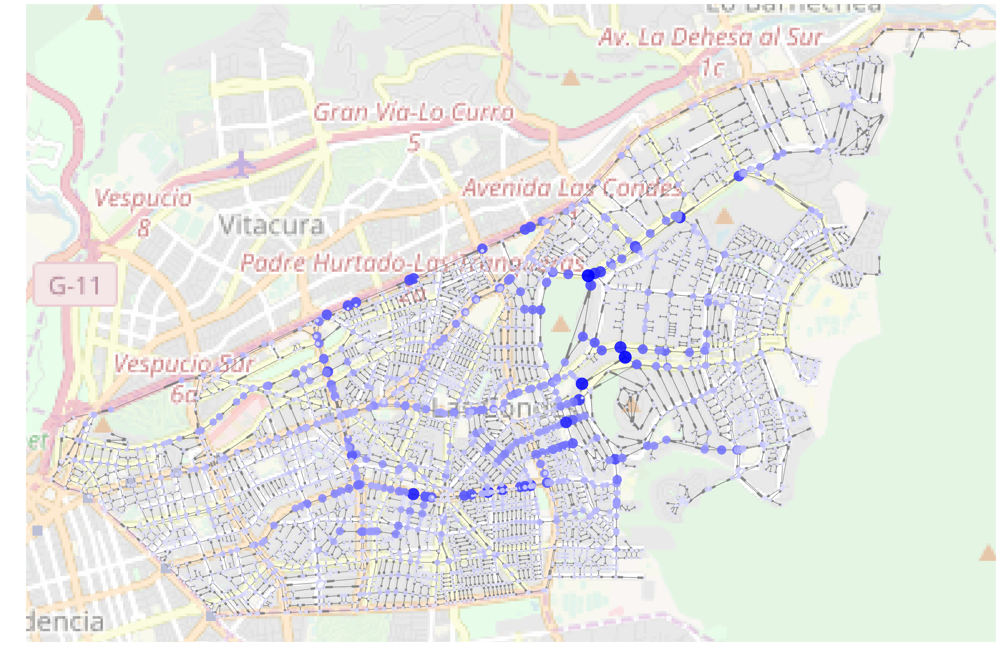

In [71]:
b = nx.betweenness_centrality(G)
plot_centrality(G, b)

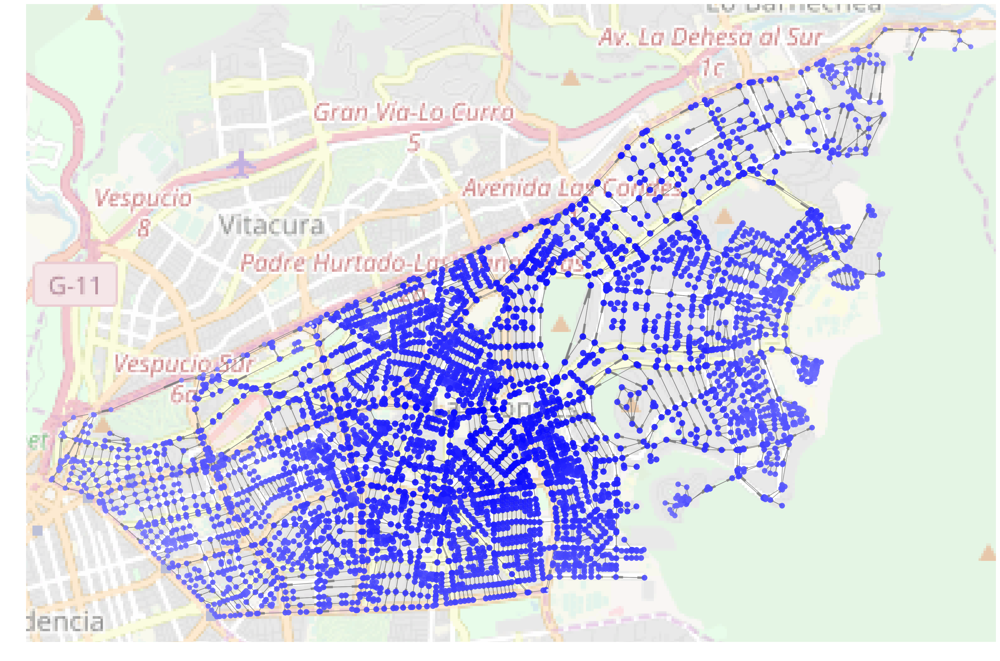

In [72]:
d = nx.closeness_centrality(G)
plot_centrality(G, d)

# Snippets :)

Betweenness
00 0.023
01 0.023
02 0.000
03 0.102
04 0.000
05 0.231
06 0.231
07 0.389
08 0.222
09 0.000
Degree centrality
00 0.444
01 0.444
02 0.333
03 0.667
04 0.333
05 0.556
06 0.556
07 0.333
08 0.222
09 0.111
Closeness centrality
00 0.529
01 0.529
02 0.500
03 0.600
04 0.500
05 0.643
06 0.643
07 0.600
08 0.429
09 0.310


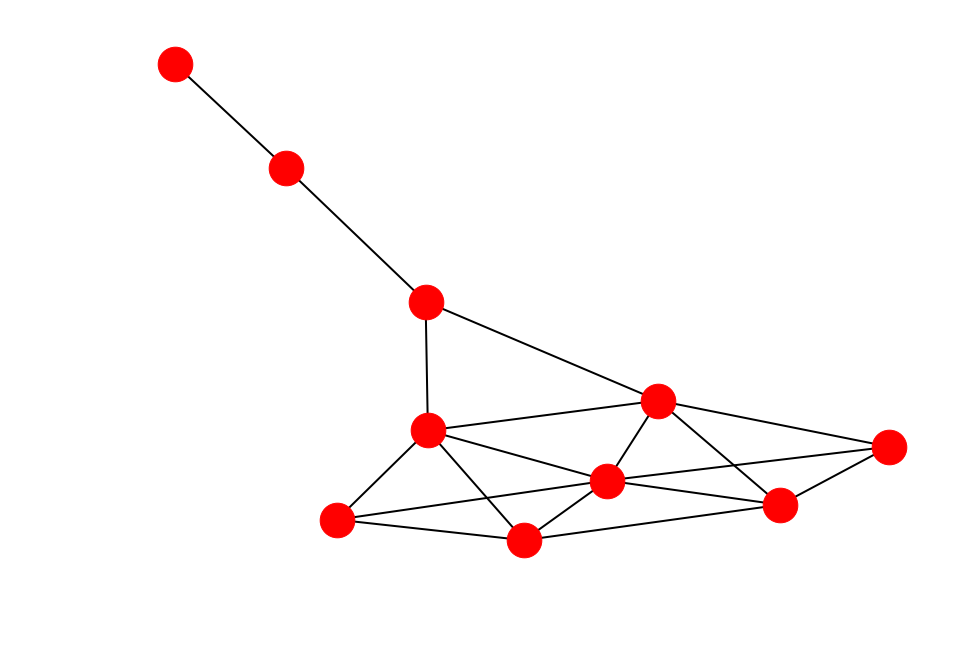

In [73]:
# Obtener el valor de la centralidad por usuario
G = nx.krackhardt_kite_graph()

print("Betweenness")
b = nx.betweenness_centrality(G)
for v in G.nodes():
    print("%0.2d %5.3f" % (v, b[v]))

print("Degree centrality")
d = nx.degree_centrality(G)
for v in G.nodes():
    print("%0.2d %5.3f" % (v, d[v]))

print("Closeness centrality")
c = nx.closeness_centrality(G)
for v in G.nodes():
    print("%0.2d %5.3f" % (v, c[v]))

nx.draw(G)

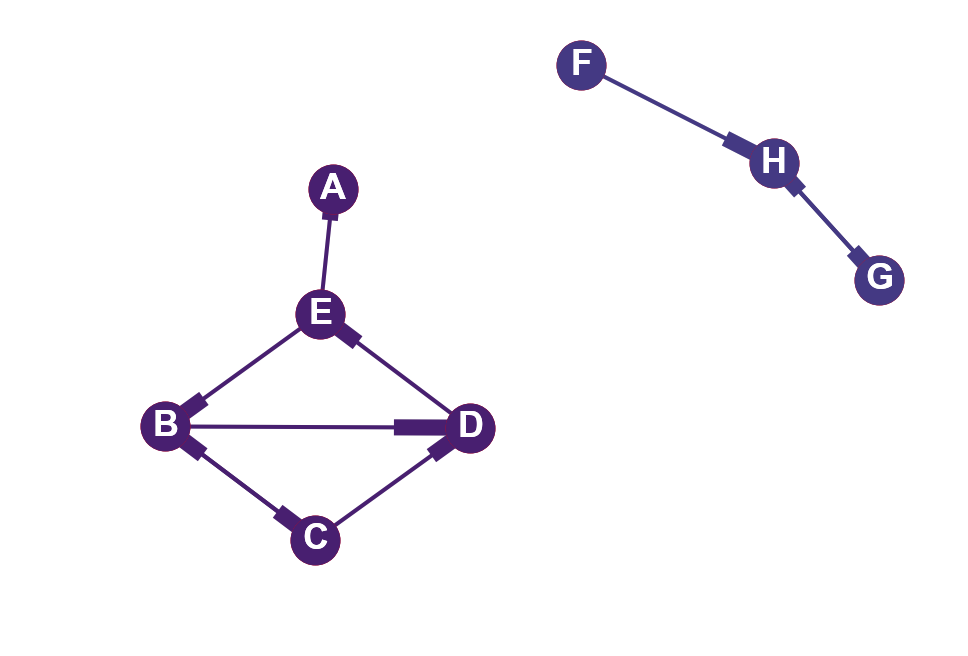

In [74]:
#calcula los componentes fuertemente conexos
wcc = list(nx.weakly_connected_component_subgraphs(diG))

#asigna un color a cada componente
colors = sns.color_palette("viridis", len(scc)).as_hex()

#opciones para dibujar el grafo y los componentes
cc_options = {'node_size':600, 'with_labels':True, 'width':2, 
              'font_color':'white', 'font_size':18, 'font_weight':'bold'}
pos = layout(diG)
nx.draw(diG, pos, edge_color='lightgray', **cc_options)
for sg, color in zip(wcc, colors):
    nx.draw(sg,pos, edge_color=color, node_color=color, **cc_options)

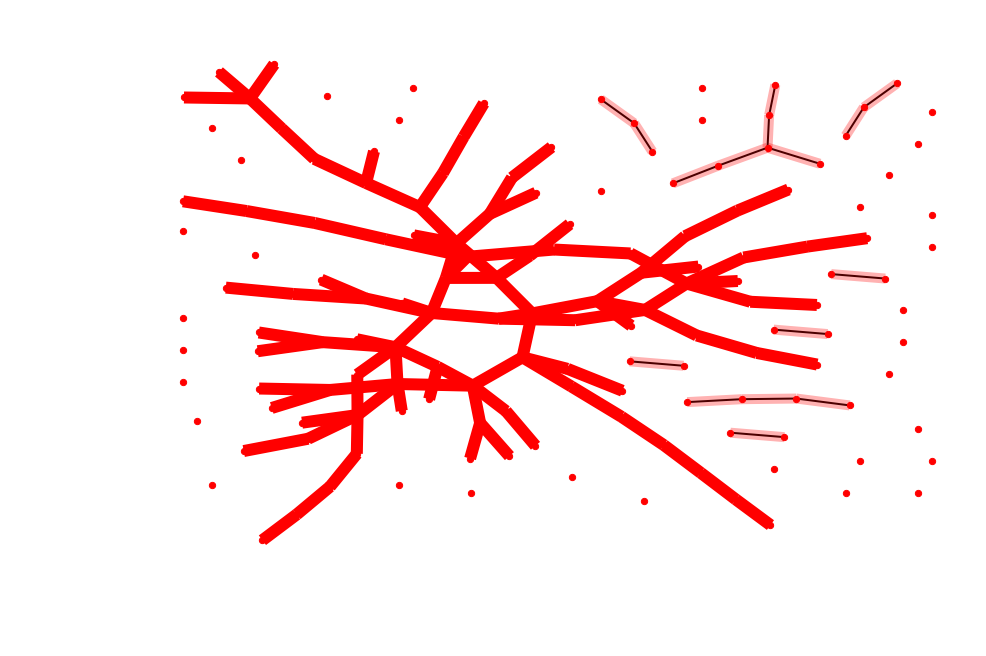

In [75]:
# genera un grafo aleatorio
G = nx.generators.erdos_renyi_graph(150,0.01)

# calcula un layout elegante
pos = layout(G)

# imprime el grafo
nx.draw(G, pos, with_labels=False, node_size=10)

# identify largest connected component
Gcc = sorted(nx.connected_component_subgraphs(G), key=len, reverse=True)
G0 = Gcc[0]
nx.draw_networkx_edges(G0, pos, with_labels=False, edge_color='r', width=6.0)

# show other connected components
for Gi in Gcc[1:]:
    if len(Gi) > 1:
        nx.draw_networkx_edges(Gi, pos, with_labels=False, edge_color='r', alpha=0.3, width=5.0)